In [1]:
# tutorial: https://stereopy.readthedocs.io/en/latest/Tutorials/clustering.html#
import stereo as st
import os
import re

os.chdir('/scratch/u/qqiu/project/multiomics/stereo_seq/result/')

2023-01-27 15:59:23.984749: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


In [2]:
E4_gef = '952BR_E4/04.tissuecut/SS200000952BR_E4.tissue.gef'
st.io.read_gef_info(E4_gef)

[2023-01-27 15:59:53][Stereo][244847][140069089462080][reader][618][INFO]: This is GEF file which contains traditional bin infomation.
[2023-01-27 15:59:53][Stereo][244847][140069089462080][reader][619][INFO]: bin_type: bins
[2023-01-27 15:59:53][Stereo][244847][140069089462080][reader][622][INFO]: Bin size list: ['bin1']
[2023-01-27 15:59:53][Stereo][244847][140069089462080][reader][628][INFO]: Resolution: 500
[2023-01-27 15:59:53][Stereo][244847][140069089462080][reader][631][INFO]: Gene count: 17190
[2023-01-27 15:59:53][Stereo][244847][140069089462080][reader][640][INFO]: offsetX: 0
[2023-01-27 15:59:53][Stereo][244847][140069089462080][reader][643][INFO]: offsetY: 0
[2023-01-27 15:59:53][Stereo][244847][140069089462080][reader][646][INFO]: Width: 24744
[2023-01-27 15:59:53][Stereo][244847][140069089462080][reader][649][INFO]: Height: 20737
[2023-01-27 15:59:53][Stereo][244847][140069089462080][reader][652][INFO]: Max Exp: 196


{'bin_list': ['bin1'],
 'resolution': 500,
 'gene_count': 17190,
 'offsetX': 0,
 'offsetY': 0,
 'width': 24744,
 'height': 20737,
 'maxExp': 196}

In [32]:
data = st.io.read_gef(file_path=E4_gef, bin_size=50)

[2023-01-27 16:25:15][Stereo][244847][140069089462080][reader][518][INFO]: read_gef begin ...
[2023-01-27 16:25:19][Stereo][244847][140069089462080][reader][591][INFO]: the matrix has 81080 cells, and 17190 genes.
[2023-01-27 16:25:20][Stereo][244847][140069089462080][reader][599][INFO]: read_gef end.


[2023-01-27 16:25:20][Stereo][244847][140069089462080][st_pipeline][40][INFO]: start to run cal_qc...
[2023-01-27 16:25:20][Stereo][244847][140069089462080][st_pipeline][43][INFO]: cal_qc end, consume time 0.0991s.


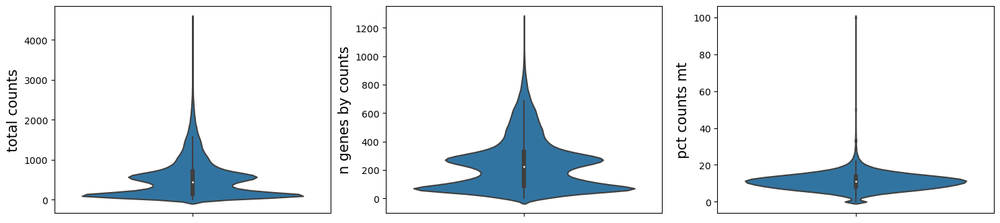

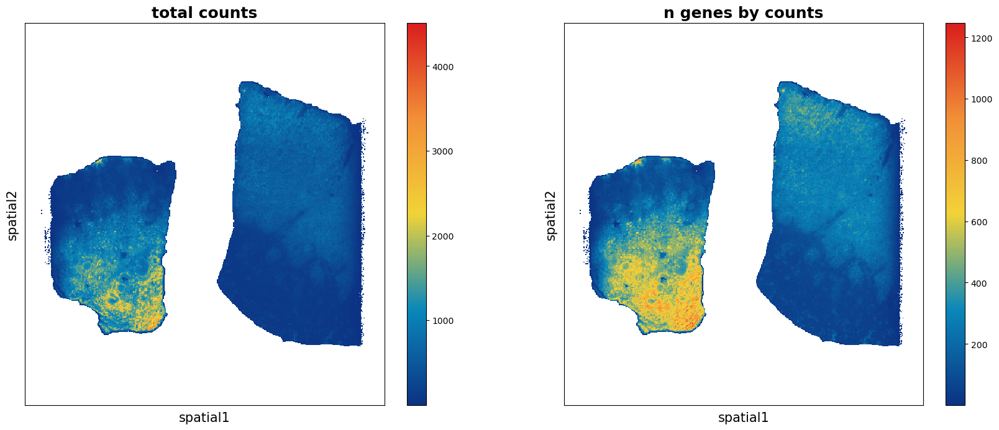

In [33]:
## quality control
data.tl.cal_qc()
data.plt.violin()
data.plt.spatial_scatter()

In [34]:
pattern = re.compile(r'^Rp[Sl]\d+|^Ig|^[Mm]t-')
black_gene_list = [i for i in data.gene_names if pattern.search(i)]
remain_gene_list = [i for i in data.gene_names if i not in black_gene_list]

In [35]:
# print(black_gene_list)
len(remain_gene_list)

17094

In [36]:
## filtering
# data.plt.genes_count()
data.tl.filter_cells(min_gene=50, min_n_genes_by_counts=3, pct_counts_mt=30, inplace=True)
data.tl.filter_genes(min_cell=3, gene_list=remain_gene_list, inplace=True)

[2023-01-27 16:25:23][Stereo][244847][140069089462080][st_pipeline][40][INFO]: start to run filter_cells...
[2023-01-27 16:25:24][Stereo][244847][140069089462080][st_pipeline][43][INFO]: filter_cells end, consume time 0.1102s.
[2023-01-27 16:25:24][Stereo][244847][140069089462080][st_pipeline][40][INFO]: start to run filter_genes...
[2023-01-27 16:25:24][Stereo][244847][140069089462080][st_pipeline][43][INFO]: filter_genes end, consume time 0.2114s.


In [37]:
data.exp_matrix.shape

(77323, 16072)

In [38]:
## normalization
data.tl.raw_checkpoint() # save raw exp_matrix
#data.tl.sctransform(n_genes=2000, res_key="sct")

#data.tl.highly_variable_genes(min_mean=0.0125, max_mean=3,min_disp=0.5,
#                              n_top_genes=2000, res_key='hvg_sct')
#data.plt.highly_variable_genes(res_key='hvg_sct')

[2023-01-27 16:25:24][Stereo][244847][140069089462080][st_pipeline][40][INFO]: start to run normalize_total...
[2023-01-27 16:25:24][Stereo][244847][140069089462080][st_pipeline][43][INFO]: normalize_total end, consume time 0.1122s.
[2023-01-27 16:25:24][Stereo][244847][140069089462080][st_pipeline][40][INFO]: start to run log1p...
[2023-01-27 16:25:24][Stereo][244847][140069089462080][st_pipeline][43][INFO]: log1p end, consume time 0.0424s.
[2023-01-27 16:25:24][Stereo][244847][140069089462080][st_pipeline][40][INFO]: start to run highly_variable_genes...
[2023-01-27 16:25:25][Stereo][244847][140069089462080][st_pipeline][43][INFO]: highly_variable_genes end, consume time 0.7313s.


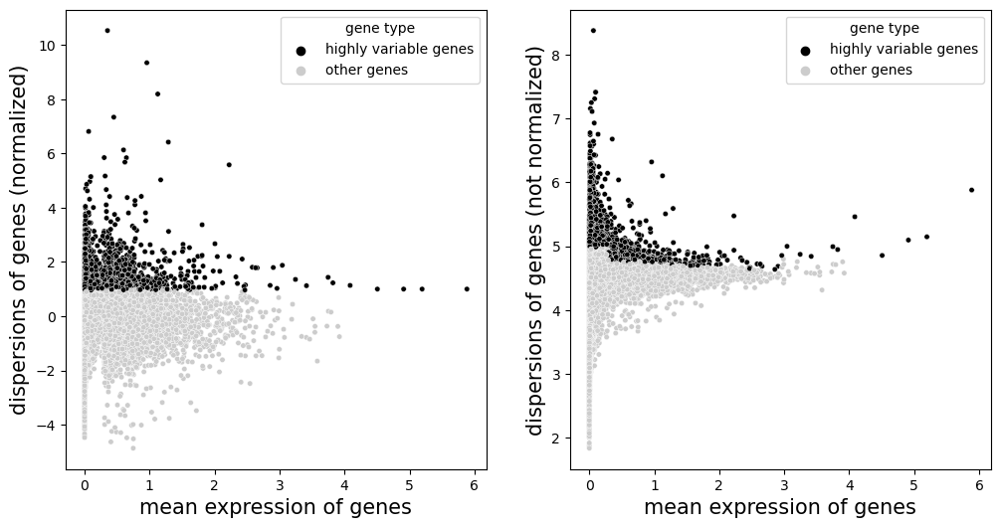

In [39]:
data.tl.normalize_total(target_sum=10000, res_key="nt")
data.tl.log1p(res_key="log1p")

data.tl.highly_variable_genes(min_mean=0.0125, max_mean=3,min_disp=0.5,
                              n_top_genes=2000, res_key='hvg_nt')
data.plt.highly_variable_genes(res_key='hvg_nt')

In [40]:
data.tl.scale(max_value=10, zero_center=True)

[2023-01-27 16:25:26][Stereo][244847][140069089462080][st_pipeline][40][INFO]: start to run scale...
[2023-01-27 16:25:35][Stereo][244847][140069089462080][scale][52][INFO]: Truncate at max_value 10
[2023-01-27 16:25:36][Stereo][244847][140069089462080][st_pipeline][43][INFO]: scale end, consume time 10.2830s.


In [41]:
data.tl.pca(use_highly_genes=True, n_pcs=20, res_key='pca', hvg_res_key="hvg_nt")

[2023-01-27 16:25:36][Stereo][244847][140069089462080][st_pipeline][40][INFO]: start to run pca...
[2023-01-27 16:25:44][Stereo][244847][140069089462080][st_pipeline][43][INFO]: pca end, consume time 8.0423s.


In [42]:
data.tl.neighbors(pca_res_key='pca', n_pcs=20, res_key='neighbors', n_jobs=6)
data.tl.umap(pca_res_key='pca', neighbors_res_key='neighbors', res_key='umap')

[2023-01-27 16:25:44][Stereo][244847][140069089462080][st_pipeline][40][INFO]: start to run neighbors...
[2023-01-27 16:25:49][Stereo][244847][140069089462080][st_pipeline][43][INFO]: neighbors end, consume time 4.8588s.
[2023-01-27 16:25:49][Stereo][244847][140069089462080][st_pipeline][40][INFO]: start to run umap...


	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs


[2023-01-27 16:26:29][Stereo][244847][140069089462080][st_pipeline][43][INFO]: umap end, consume time 40.3769s.


In [43]:
marker_list = ['Nphs1', 'Ncam1', 'Slc34a1', 'Slc7a12', 
                'Havcr1', 'Fst', 'Atp10b', 'Slc12a1', 'Nos1',
                'Slc12a3', 'Slc8a1', 'Aqp2', 'Kit', 'Slc26a4',
                'Flt1', 'Ren1', 'Ptprc']

marker_list_use = [i for i in marker_list if i in data.gene_names]

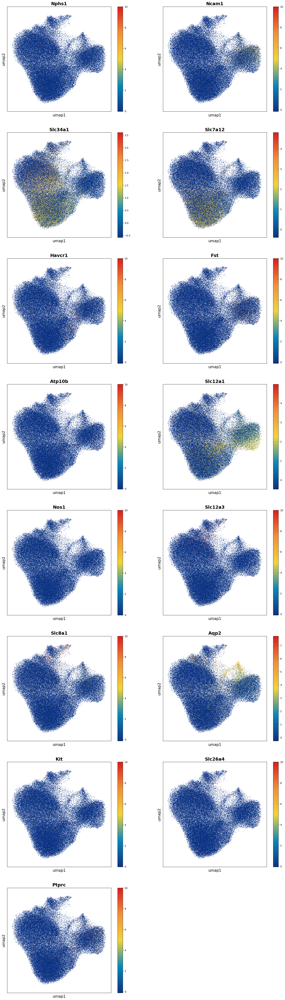

In [44]:
fig = data.plt.umap(gene_names=marker_list_use, res_key='umap')

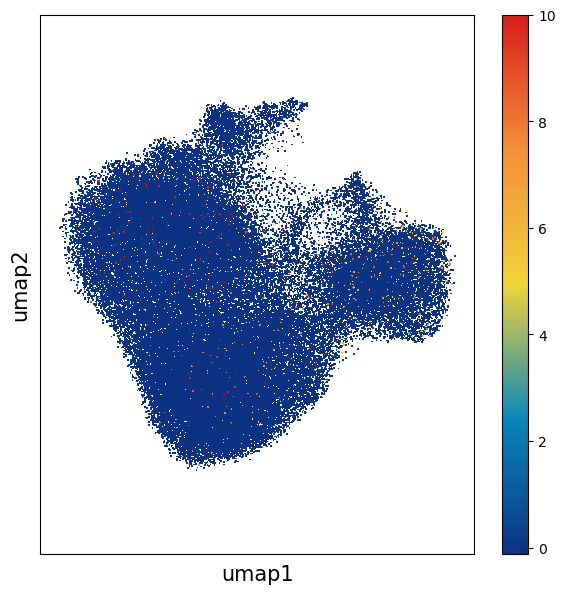

In [45]:
fig = data.plt.umap(gene_names=['Podxl'], res_key='umap')

[2023-01-27 16:27:01][Stereo][244847][140069089462080][st_pipeline][40][INFO]: start to run louvain...
[2023-01-27 16:27:02][Stereo][244847][140069089462080][_louvain][99][INFO]:     using the "louvain" package of Traag (2017)
[2023-01-27 16:27:09][Stereo][244847][140069089462080][st_pipeline][43][INFO]: louvain end, consume time 7.5125s.


<AxesSubplot:title={'center':'louvain'}, xlabel='umap1', ylabel='umap2'>

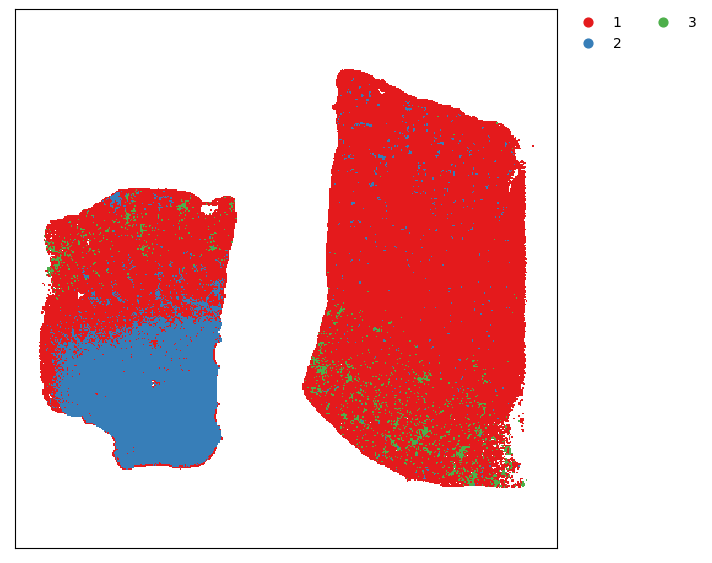

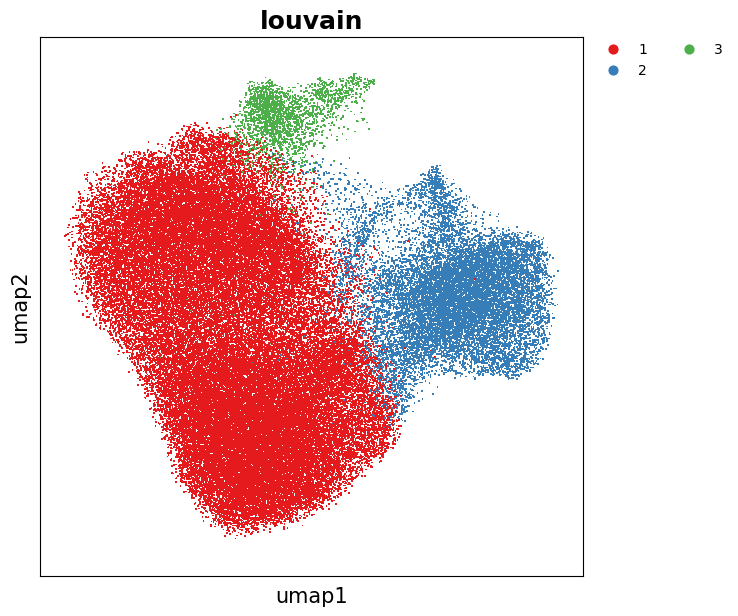

In [46]:
data.tl.louvain(neighbors_res_key='neighbors', res_key='louvain', resolution=0.3)
data.plt.cluster_scatter(res_key='louvain')
data.plt.umap(res_key='umap', cluster_key='louvain')

[2023-01-27 16:27:10][Stereo][244847][140069089462080][st_pipeline][40][INFO]: start to run louvain...
[2023-01-27 16:27:10][Stereo][244847][140069089462080][_louvain][99][INFO]:     using the "louvain" package of Traag (2017)
[2023-01-27 16:27:22][Stereo][244847][140069089462080][st_pipeline][43][INFO]: louvain end, consume time 12.7201s.


<AxesSubplot:title={'center':'louvain_0.8'}, xlabel='umap1', ylabel='umap2'>

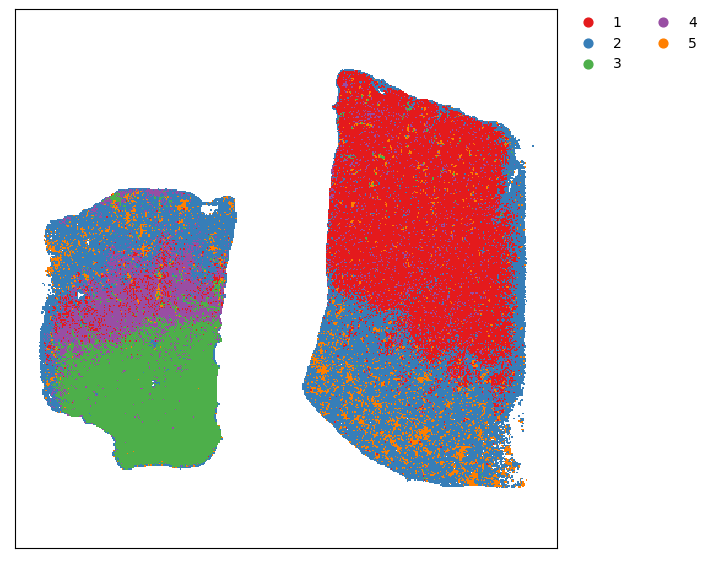

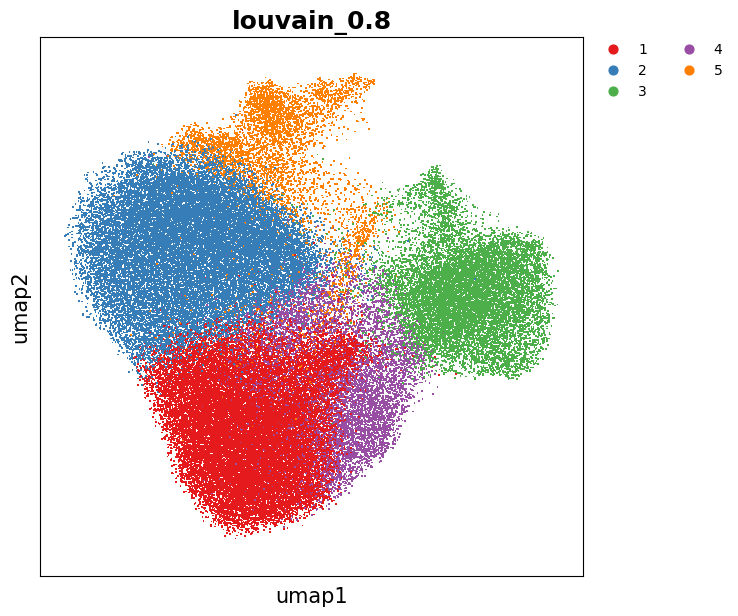

In [47]:
data.tl.louvain(neighbors_res_key='neighbors', res_key='louvain_0.8', resolution=0.8)
data.plt.cluster_scatter(res_key='louvain_0.8')
data.plt.umap(res_key='umap', cluster_key='louvain_0.8')

[2023-01-27 16:27:24][Stereo][244847][140069089462080][st_pipeline][40][INFO]: start to run leiden...
[2023-01-27 16:27:40][Stereo][244847][140069089462080][st_pipeline][43][INFO]: leiden end, consume time 16.0587s.


<AxesSubplot:title={'center':'leiden'}, xlabel='umap1', ylabel='umap2'>

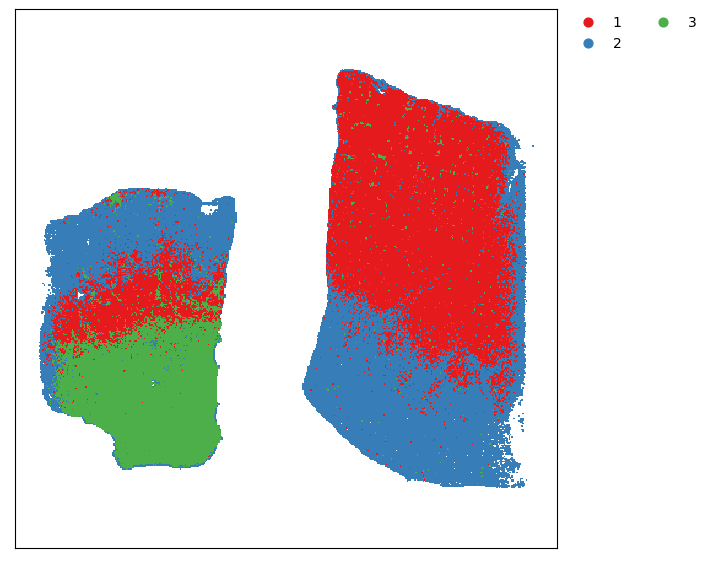

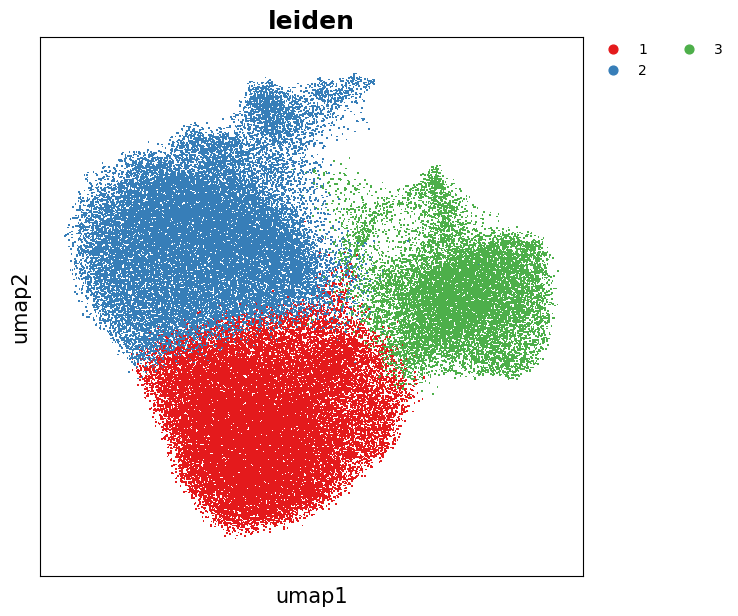

In [48]:
data.tl.leiden(neighbors_res_key='neighbors', res_key='leiden', resolution=0.2)
data.plt.cluster_scatter(res_key='leiden')
data.plt.umap(res_key='umap', cluster_key='leiden')

[2023-01-27 16:27:41][Stereo][244847][140069089462080][st_pipeline][40][INFO]: start to run leiden...
[2023-01-27 16:28:01][Stereo][244847][140069089462080][st_pipeline][43][INFO]: leiden end, consume time 20.3782s.


<AxesSubplot:title={'center':'leiden_0.6'}, xlabel='umap1', ylabel='umap2'>

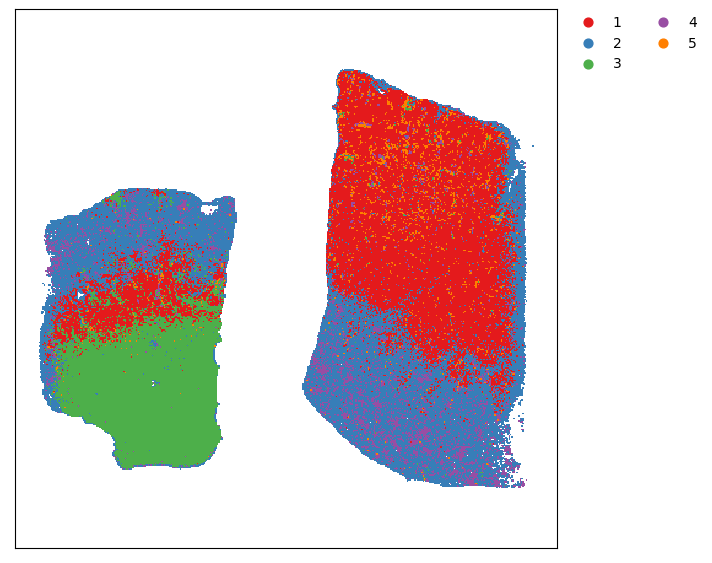

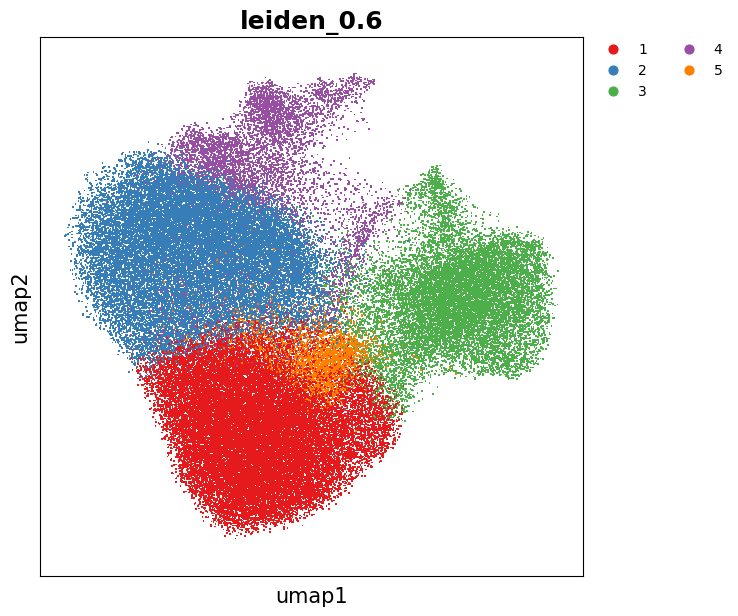

In [49]:
data.tl.leiden(neighbors_res_key='neighbors', res_key='leiden_0.6', resolution=0.6)
data.plt.cluster_scatter(res_key='leiden_0.6')
data.plt.umap(res_key='umap', cluster_key='leiden_0.6')

In [50]:
#data.tl.phenograph(phenograph_k=30, pca_res_key='pca', res_key='phenograph')
#data.plt.cluster_scatter(res_key='phenograph')
#data.plt.umap(res_key='umap', cluster_key='phenograph')

In [51]:
# data.tl.gaussian_smooth(n_neighbors=10, smooth_threshold=90 inplace=False, res_key="gs")
# data.tl.scale(max_value=10) #only for gaussian_smooth_scatter_by_gene

In [52]:
data.tl.find_marker_genes(cluster_res_key='leiden_0.6', method='wilcoxon_test', use_highly_genes=True, use_raw=False, hvg_res_key="hvg_nt")

[2023-01-27 16:28:02][Stereo][244847][140069089462080][st_pipeline][40][INFO]: start to run find_marker_genes...
[2023-01-27 16:28:10][Stereo][244847][140069089462080][tool_base][117][INFO]: read group information, grouping by group column.
[2023-01-27 16:28:10][Stereo][244847][140069089462080][tool_base][155][INFO]: start to run...
[2023-01-27 16:28:10][Stereo][244847][140069089462080][find_markers][103][INFO]: cal rankdata
[2023-01-27 16:28:14][Stereo][244847][140069089462080][find_markers][105][INFO]: cal tie_term
[2023-01-27 16:28:14][Stereo][244847][140069089462080][find_markers][108][INFO]: cal tie_term end
Find marker gene:   0%|          | 0/5 [00:00<?, ?it/s][2023-01-27 16:28:14][Stereo][244847][140069089462080][find_markers][119][INFO]: start to select group
[2023-01-27 16:28:15][Stereo][244847][140069089462080][find_markers][122][INFO]: end selelct group
Find marker gene:  20%|██        | 1/5 [00:01<00:06,  1.56s/it][2023-01-27 16:28:16][Stereo][244847][140069089462080][find

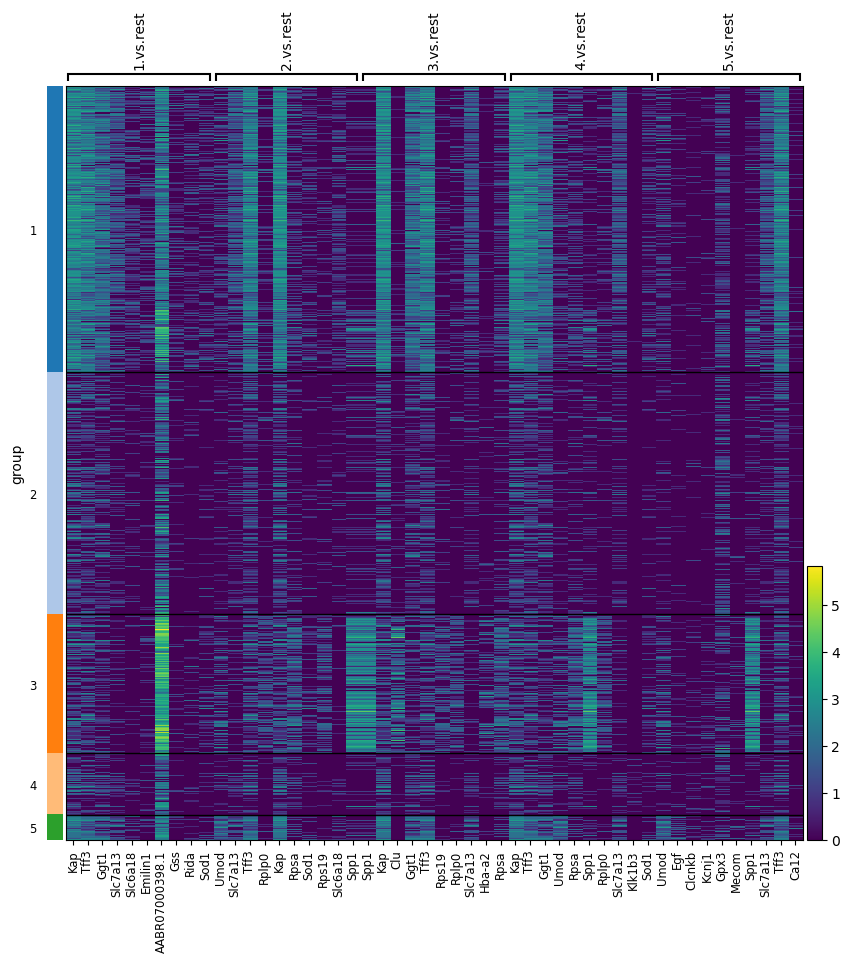

In [53]:
data.plt.marker_genes_heatmap(res_key='marker_genes', cluster_res_key='leiden_0.6', markers_num=10, do_log=True)

In [54]:
# st.io.write_mid_gef(data=data, output='/scratch/u/qqiu/project/multiomics/stereo_seq/result/stereopy/SS200000952BR_E4.bin50.filter.gef')

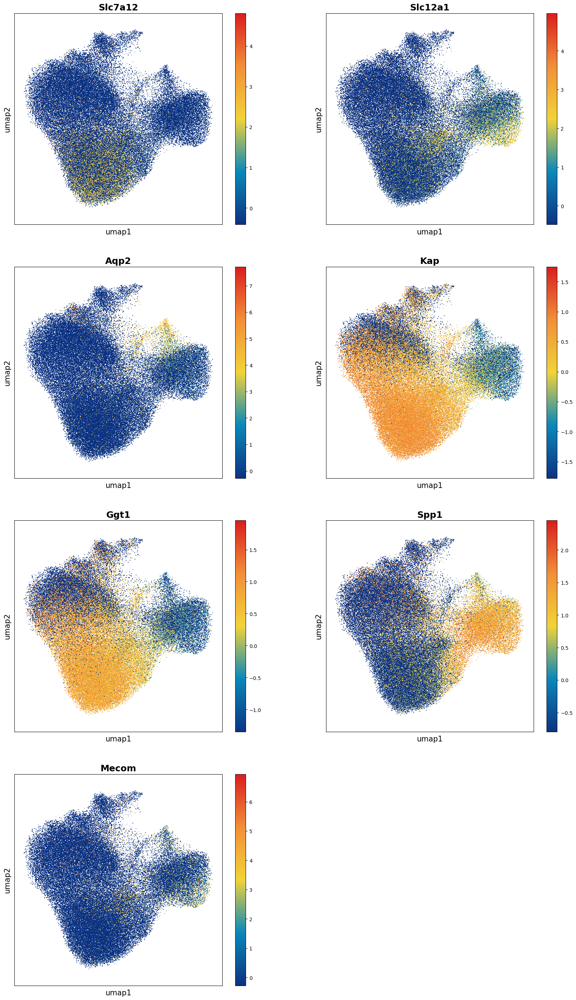

In [55]:
fig = data.plt.umap(gene_names=['Slc7a12', 'Slc12a1', 'Aqp2', 'Kap', 'Ggt1', 'Spp1', 'Mecom'], res_key='umap')

In [ ]:
# data.plt.gaussian_smooth_scatter_by_gene(gene_name='Spp1')

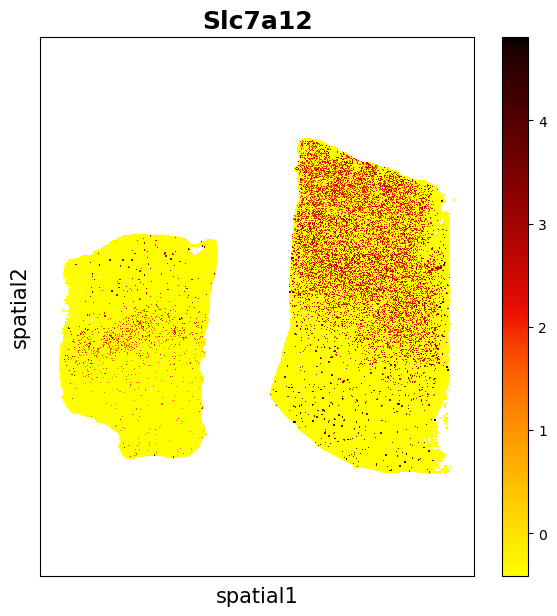

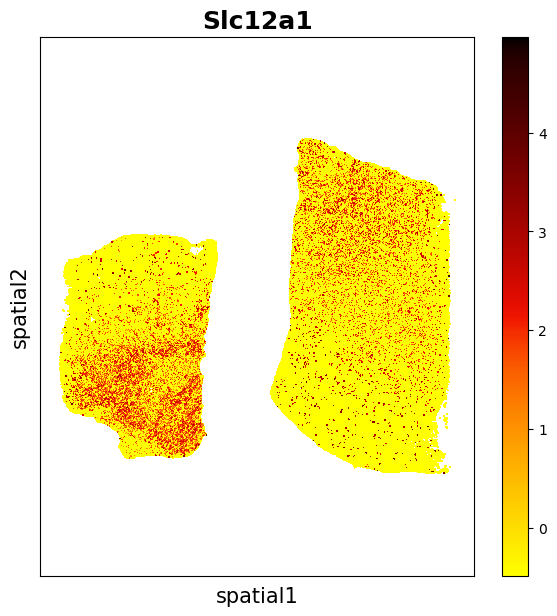

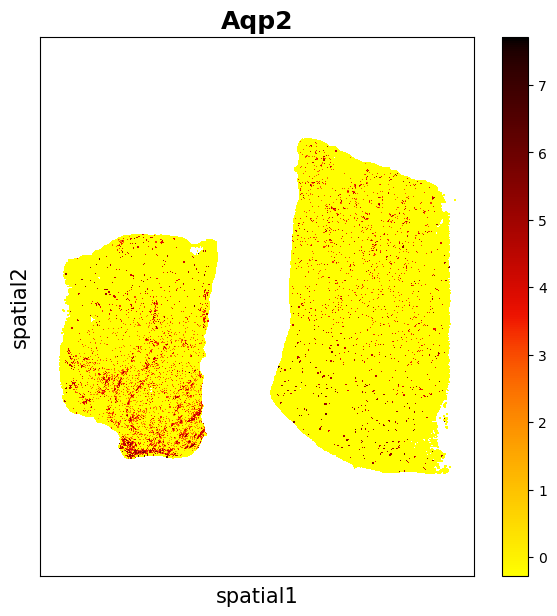

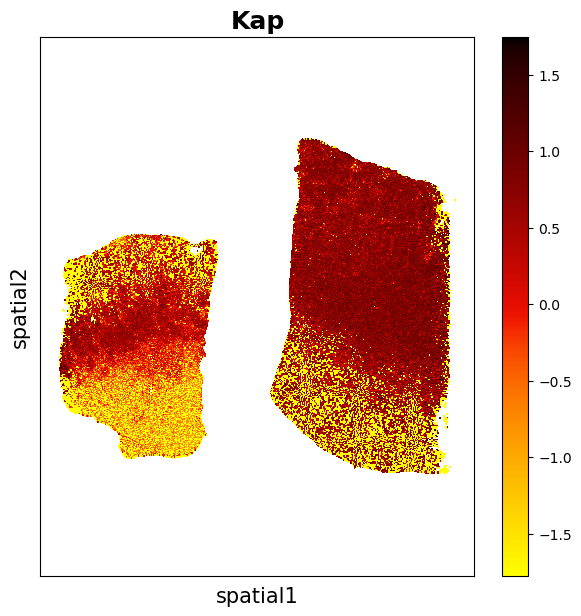

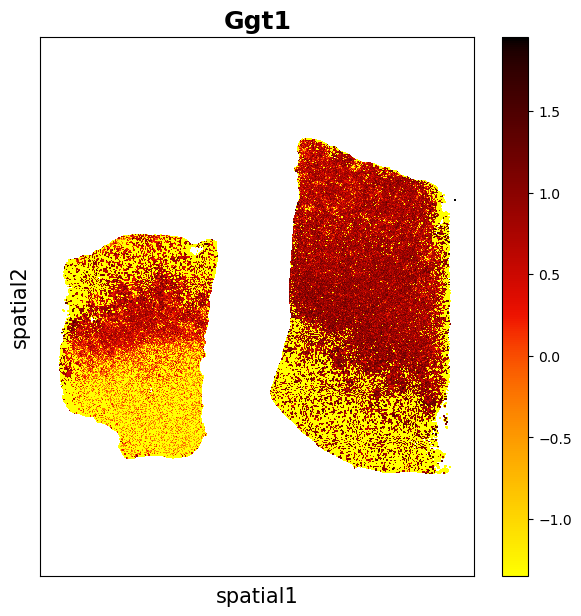

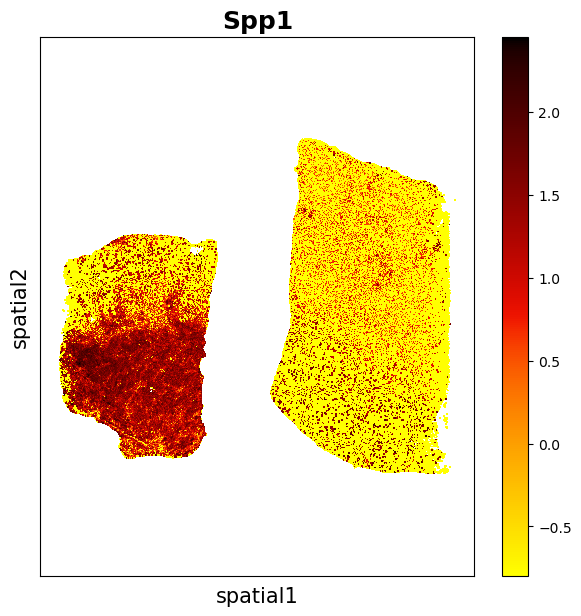

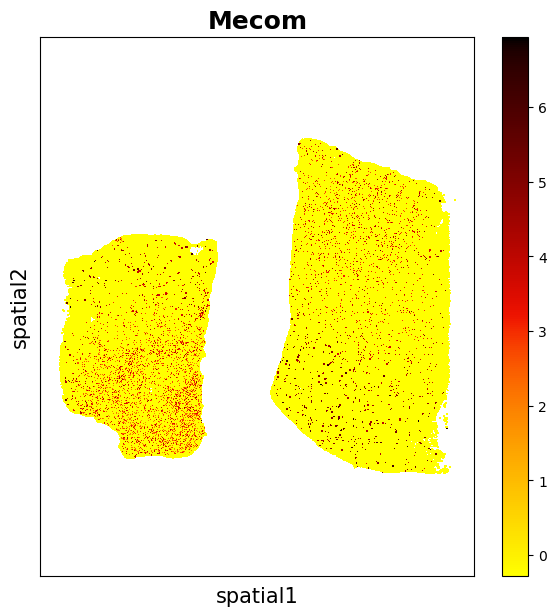

In [56]:
data.plt.spatial_scatter_by_gene(gene_name='Slc7a12')
data.plt.spatial_scatter_by_gene(gene_name='Slc12a1')
data.plt.spatial_scatter_by_gene(gene_name='Aqp2')
data.plt.spatial_scatter_by_gene(gene_name='Kap')
data.plt.spatial_scatter_by_gene(gene_name='Ggt1')
data.plt.spatial_scatter_by_gene(gene_name='Spp1')
data.plt.spatial_scatter_by_gene(gene_name='Mecom')